In [ ]:
import tensorflow as tf
from tensorflow.keras import mixed_precision
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Dense, Dropout, 
                                   BatchNormalization, Input, GlobalAveragePooling2D, 
                                   Concatenate, Multiply, Flatten)
from tensorflow.keras.utils import Sequence
from tensorflow.keras import backend as K
import os
import cv2
import random
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as A
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

2025-05-16 06:25:28.583262: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-16 06:25:28.583334: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-16 06:25:28.584546: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-16 06:25:28.590631: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.11/dist-packages/albumentation

In [2]:
# === Configuration ===
config = {
    "epochs": 50,
    "is_config_batch_size_param": True,
    "batch_size": 100,
    "initial_lr": 0.001,
    "gpu_memory_limit": 48,  
    "target_size": (480, 640),
    "input_shape": (640, 480, 3),
    "data_path": "Dataset/train_images",
    "csv_path": "processed_data/cleaned_imbalance_metadata.csv",
    "train_set_csv": "Result/training6_alex_incept_fs/training6_alex_incept_fs_train_set.csv",
    "val_set_csv": "Result/training6_alex_incept_fs/training6_alex_incept_fs_validation_set.csv",
    "best_model": "Result/training6_alex_incept_fs/training6_alex_incept_fs_best_model.keras",
    "label_encoder_path": "Result/training6_alex_incept_fs/training6_alex_incept_fs_label_encoder.npy",
    "color_channel": "",
    "save_dir": "Result/training6_alex_incept_fs",
}

In [3]:
# === GPU Setup ===
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices=false'
os.environ['CUDA_VISIBLE_DEVICES'] = '0'  

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        policy = mixed_precision.Policy('float32')
        mixed_precision.set_global_policy(policy)
        
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        tf.config.optimizer.set_jit(True)
        tf.config.threading.set_intra_op_parallelism_threads(8)
        tf.config.threading.set_inter_op_parallelism_threads(4)
    except RuntimeError as e:
        print(e)

def cleanup_gpu_memory():
    """Force clear GPU memory"""
    K.clear_session()
    tf.compat.v1.reset_default_graph()
    if tf.config.list_physical_devices('GPU'):
        try:
            for gpu in tf.config.list_physical_devices('GPU'):
                tf.config.experimental.set_memory_growth(gpu, True)
        except RuntimeError:
            pass

In [4]:
# === Memory Management ===
def calculate_max_batch_size(model, input_shape, gpu_mem=24, default_batch=32, is_use_config_batch_size=config["is_config_batch_size_param"]):
    """Improved batch size calculator with error handling"""
    if is_use_config_batch_size:
        return default_batch
    try:
        params = model.count_params()
        
        last_dense = None
        for layer in reversed(model.layers):
            if isinstance(layer, tf.keras.layers.Dense):
                last_dense = layer
                if layer.name == 'features':  
                    break
        
        if last_dense is None:
            raise ValueError("No Dense layer found in model!")
        
        # Memory per sample = weights + activations (in GB)
        per_sample = (
            (params * 4) +                 
            (np.prod(input_shape) * last_dense.units * 4)  
        ) / (1024 ** 3)
        
        # Max batch size with 3GB safety margin
        max_batch = int((gpu_mem - 3) / per_sample)
        return min(256, max_batch)  
    
    except Exception as e:
        print(f"Warning: Batch size estimation failed, using default={default_batch}. Error: {e}")
        return default_batch

In [5]:
# === Data Pipeline ===
def load_and_preprocess_data(random_state=42, save_splits=True):
    """Load and split data with fixed random state for reproducibility"""
    df = pd.read_csv(config["csv_path"])
    
    le = LabelEncoder()
    df['label_encoded'] = le.fit_transform(df['label'])
    print(f"Label classes: {le.classes_}")
    
    with open(config['label_encoder_path'], 'wb') as f:
        np.save(f, le.classes_)
    
    train_df, val_df = train_test_split(
        df, 
        test_size=0.2, 
        stratify=df['label'],
        random_state=random_state,
    )
    
    if save_splits:
        train_df.to_csv(config['train_set_csv'], index=False)
        val_df.to_csv(config['val_set_csv'], index=False)
    
    return train_df, val_df, le

In [6]:
class DataGenerator(Sequence):
    def __init__(self, df, base_path, batch_size=32, target_size={config['target_size']}, shuffle=False, debug=False, input_config=None, **kwargs):
        super().__init__(**kwargs)
        self.df = df.reset_index(drop=True)
        self.base_path = base_path
        self.batch_size = batch_size
        self.target_size = target_size  
        self.shuffle = shuffle
        self.debug = debug
        self.indices = np.arange(len(df))
        self.input_config = input_config
        
        self.aug = A.Compose(input_config["augmentation"])
        
        if shuffle:
            np.random.shuffle(self.indices)
            
        if self.debug:
            self.visualize_samples()    
            

    def visualize_samples(self):        
        try:
            row = self.df.iloc[0]
            img = self._load_image(row['image_id'], row['label'])
            augmented = self.aug(image=img)
            
            plt.figure(figsize=(12, 6))
            
            # original
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title(f"Original\nShape: {img.shape}")
            
            # augmented
            plt.subplot(1, 2, 2)
            plt.imshow(augmented['image'])
            plt.title(f"Augmented\nShape: {augmented['image'].shape}")
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Visualization failed for {row['image_id']}: {str(e)}")
    
    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))
    
    def _load_image(self, image_id, label):
        img_path = os.path.join(
            self.base_path,
            label,
            f"{os.path.splitext(image_id)[0]}.jpg"
        )
        img = cv2.imread(img_path)
        if img is None:
            raise FileNotFoundError(f"Image not found at {img_path}")
        return img
    
    def __getitem__(self, idx):
        batch_indices = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]
        batch_df = self.df.iloc[batch_indices]
        
        X = np.zeros((len(batch_df), self.target_size[1], self.target_size[0], 3), dtype=np.float32) #(batch, height, width, channels)
        y = np.zeros((len(batch_df),), dtype=np.int32)
        
        for i, (_, row) in enumerate(batch_df.iterrows()):
            try:
                img = self._load_image(row['image_id'], row['label'])
                augmented = self.aug(image=img)
                X[i] = augmented['image'] / 255.0
                y[i] = row['label_encoded']
            except Exception as e:
                print(f"Error loading {row['image_id']}: {str(e)}")
                X[i] = np.zeros((self.target_size[1], self.target_size[0], 3), dtype=np.float32) #(batch, height, width, channels)
                y[i] = -1
                
        valid = y != -1
        return X[valid], y[valid]

In [7]:
def se_block(input_tensor, ratio=16):
    channels = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Dense(channels // ratio, activation="relu")(se)
    se = Dense(channels, activation="sigmoid")(se)
    return Multiply()([input_tensor, se])

def create_custom_Alex_Inception(input_shape=(224, 224, 3), num_classes=1000):
    inputs = Input(shape=input_shape, dtype=tf.float32) 
     
    # Initial feature extraction
    x = Conv2D(96, (7,7), strides=2, activation='relu', padding='same')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D((3,3), strides=2)(x)
    
    x = se_block(x)

    # Intermediate layers
    x = Conv2D(256, (5,5), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((3,3), strides=2)(x)
    
    # Parallel paths
    branch1 = Conv2D(384, (3,3), activation='relu', padding='same')(x)
    branch2 = Conv2D(384, (3,3), dilation_rate=2, activation='relu', padding='same')(x)
    x = Concatenate()([branch1, branch2])
        
    # Final classification head
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu', name='features')(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation='softmax', dtype=tf.float32)(x)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)

In [8]:
# === Training ===
def train(config, best_model_path):
    cleanup_gpu_memory()
    
    try:
        train_df, val_df, le = load_and_preprocess_data(random_state=42)
        num_classes = len(le.classes_)
        print("Classes: ", num_classes)
        
        # Create the mopdel
        input_shape = config["input_shape"] 
        model = create_custom_Alex_Inception(input_shape, num_classes)
        
        # Find optimal batch size
        cleanup_gpu_memory()
        optimized_batch_size = calculate_max_batch_size(
                                    model, 
                                    input_shape=config["input_shape"],
                                    gpu_mem=config["gpu_memory_limit"],
                                    default_batch=config["batch_size"],
                                )
        
        print(f"\n=== Training Configuration ===")
        print(f"Batch size: {optimized_batch_size}")
        print(f"Input size: {config['target_size']}")
        print(f"Classes: {num_classes}")
        print(f"GPU Memory: {config['gpu_memory_limit']}GB\n")
        print(f"Model input shape: {model.input_shape}")
        
        train_gen = DataGenerator(
            df=train_df,
            base_path=config["data_path"],
            batch_size=optimized_batch_size,
            target_size=config["target_size"],
            shuffle=False,
            debug=True,
            input_config=config
        )
        
        val_gen = DataGenerator(
            df=val_df,
            base_path=config["data_path"],
            batch_size=optimized_batch_size,
            target_size=config["target_size"],
            shuffle=False,
            debug=False,
            input_config=config
        )
        
        model.compile(
            optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
        
        sample_batch = train_gen[0]
        print(f"Generator output shape: {sample_batch[0].shape}")
        print(f"Model input shape: {model.input_shape}")
        
        # Train
        history = model.fit(
            train_gen,
            validation_data=val_gen,
            epochs=config["epochs"],
            callbacks=[
                    tf.keras.callbacks.EarlyStopping(
                    monitor='val_accuracy',
                    patience=5,  
                    mode='max',
                    restore_best_weights=True  
                ),
                tf.keras.callbacks.ModelCheckpoint(
                    best_model_path,  
                    save_weights_only=False,
                    monitor='val_accuracy',
                    save_best_only=True
                ),
                    tf.keras.callbacks.ReduceLROnPlateau(
                    monitor='val_accuracy',
                    factor=0.5,  
                    patience=3,
                    mode='max'
                )
            ]
        )
        
        return model, history
        
    except Exception as e:
        print(f"Training failed: {e}")
        cleanup_gpu_memory()
        raise

In [9]:
def plot_accuracy_loss(history):
    """Plot accuracy and loss"""
    plt.figure(figsize=(12, 5))
    
    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

In [10]:
def evaluate_model(config, best_model_path, use_val_set=True):
    """Deterministic evaluation with debug checks"""
    try:
        # Load model 
        with open(config['label_encoder_path'], 'rb') as f:
            classes = np.load(f, allow_pickle=True)
        le = LabelEncoder()
        le.classes_ = classes

        model = tf.keras.models.load_model(best_model_path, compile=False) 
            
        cleanup_gpu_memory()
        optimized_batch_size = calculate_max_batch_size(
                                    model, 
                                    input_shape=config["input_shape"],
                                    gpu_mem=config["gpu_memory_limit"],
                                    default_batch=config["batch_size"],
                                )
        
        model.compile(
            optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=[
                tf.keras.metrics.SparseCategoricalAccuracy(name='acc'),
                tf.keras.metrics.SparseTopKCategoricalAccuracy(k=3, name='top3_acc')
            ]
        )

        eval_df = pd.read_csv(config["val_set_csv"]) if use_val_set else load_and_preprocess_data(save_splits=False)[1]
        print(f"Evaluating on {len(eval_df)} samples")

        eval_gen = DataGenerator(
            df=eval_df,
            base_path=config["data_path"],
            batch_size=optimized_batch_size,  
            target_size=config["target_size"],
            shuffle=False,  
            debug=False,
            input_config=config
        )

        # Inspect first batch
        x_test, y_test = eval_gen[0]
        print(f"\n[DEBUG] First batch - X shape: {x_test.shape}, y shape: {y_test.shape}")
        print(f"[DEBUG] Sample label: {y_test[0]} -> {le.classes_[y_test[0]]}")

        # Standard evaluation
        results = model.evaluate(eval_gen, verbose=1, return_dict=True)
        print("\n[METRICS] Evaluation Results:", results)

        # Collect predictions
        y_true, y_pred = [], []
        for i in range(len(eval_gen)):
            x, y = eval_gen[i]
            y_true.extend(y)
            y_pred.extend(model.predict(x, verbose=0).argmax(axis=1))
        
        # Plot confusion matrix
        plot_confusion_matrix(y_true, y_pred, le.classes_, normalize=True)
        
        print("\nClassification Report:")
        print(classification_report(y_true, y_pred, target_names=le.classes_))

        return results

    except Exception as e:
        print(f"Evaluation failed: {e}")
        raise
    
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title=None):
    """Plot confusion matrix"""
    cm = confusion_matrix(y_true, y_pred)
    fmt = '.2f' if normalize else 'd'
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt=fmt, xticklabels=classes, yticklabels=classes,
                cmap='Blues', cbar=False)
    plt.title(title or 'Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


Label classes: ['bacterial_leaf_blight' 'bacterial_leaf_streak'
 'bacterial_panicle_blight' 'blast' 'brown_spot' 'dead_heart'
 'downy_mildew' 'hispa' 'normal' 'tungro']
Classes:  10


2025-05-16 06:25:38.988838: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46771 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:c3:00.0, compute capability: 8.6



=== Training Configuration ===
Batch size: 100
Input size: (480, 640)
Classes: 10
GPU Memory: 48GB

Model input shape: (None, 640, 480, 3)


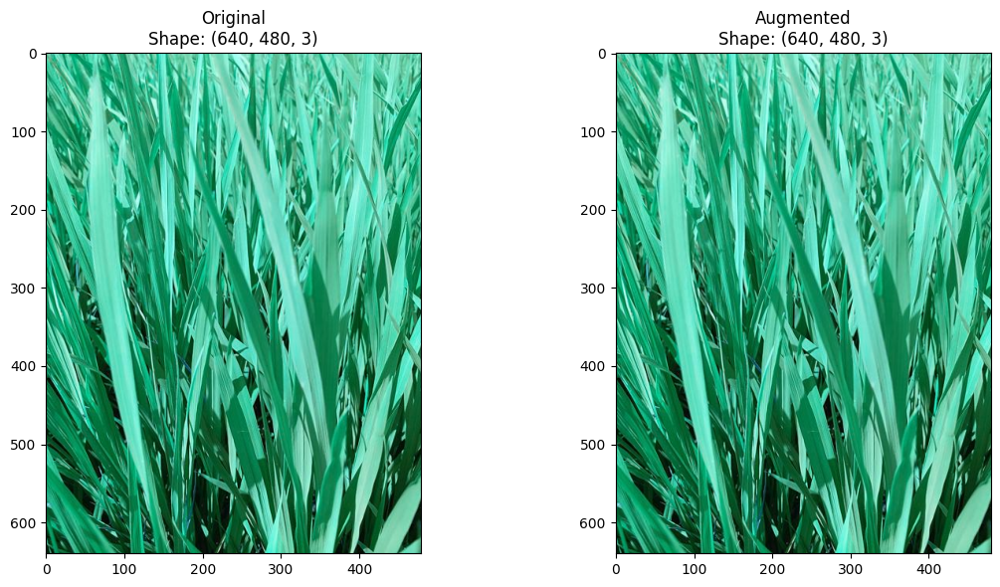

Generator output shape: (100, 640, 480, 3)
Model input shape: (None, 640, 480, 3)
Epoch 1/50


2025-05-16 06:25:42.933349: I external/local_xla/xla/service/service.cc:168] XLA service 0x7034a4002610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-16 06:25:42.933406: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-05-16 06:25:42.940686: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-16 06:25:43.007527: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
I0000 00:00:1747376768.460863    2846 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2025-05-16 06:26:42.689923: W external/local_tsl/tsl/framework/bfc_allocator.cc:366] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to a

82/82 [==============================] - 208s 1s/step - loss: 2.2069 - accuracy: 0.2453 - val_loss: 2.2788 - val_accuracy: 0.1739 - lr: 0.0010
Epoch 2/50
82/82 [==============================] - 153s 2s/step - loss: 1.9356 - accuracy: 0.3078 - val_loss: 3.4060 - val_accuracy: 0.1695 - lr: 0.0010
Epoch 3/50
82/82 [==============================] - 88s 1s/step - loss: 1.8355 - accuracy: 0.3439 - val_loss: 2.9604 - val_accuracy: 0.1842 - lr: 0.0010
Epoch 4/50
82/82 [==============================] - 88s 1s/step - loss: 1.7606 - accuracy: 0.3775 - val_loss: 2.9644 - val_accuracy: 0.1725 - lr: 0.0010
Epoch 5/50
82/82 [==============================] - 86s 1s/step - loss: 1.6797 - accuracy: 0.4053 - val_loss: 2.0338 - val_accuracy: 0.2856 - lr: 0.0010
Epoch 6/50
82/82 [==============================] - 86s 1s/step - loss: 1.5920 - accuracy: 0.4292 - val_loss: 2.5718 - val_accuracy: 0.3293 - lr: 0.0010
Epoch 7/50
82/82 [==============================] - 85s 1s/step - loss: 1.5197 - accuracy: 

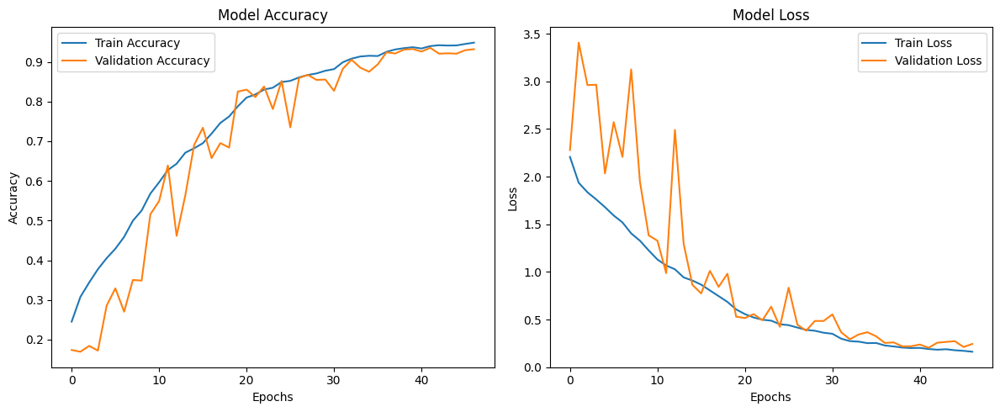

Evaluating on 2041 samples

[DEBUG] First batch - X shape: (100, 640, 480, 3), y shape: (100,)
[DEBUG] Sample label: 5 -> dead_heart
21/21 [==============================] - 17s 775ms/step - loss: 0.2044 - acc: 0.9353 - top3_acc: 0.9887

[METRICS] Evaluation Results: {'loss': 0.20435556769371033, 'acc': 0.9353258013725281, 'top3_acc': 0.9887310266494751}


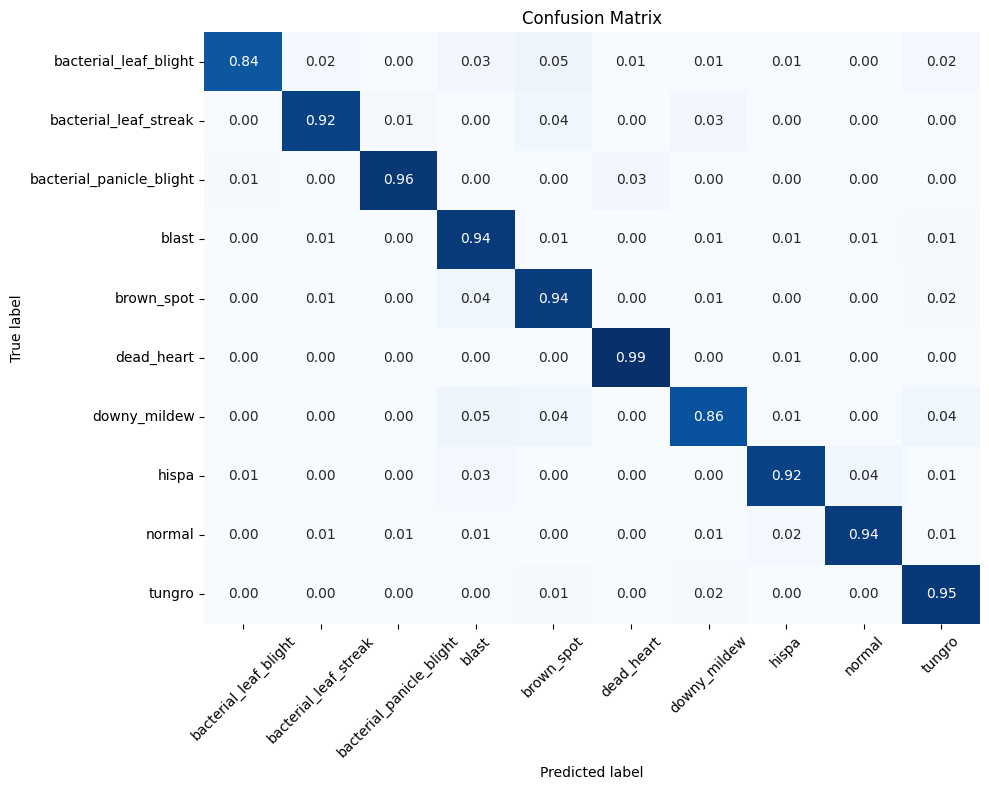


Classification Report:
                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.95      0.84      0.89        93
   bacterial_leaf_streak       0.88      0.92      0.90        73
bacterial_panicle_blight       0.93      0.96      0.94        67
                   blast       0.92      0.94      0.93       341
              brown_spot       0.91      0.94      0.92       188
              dead_heart       0.99      0.99      0.99       283
            downy_mildew       0.88      0.86      0.87       122
                   hispa       0.95      0.92      0.94       311
                  normal       0.96      0.94      0.95       349
                  tungro       0.90      0.95      0.93       214

                accuracy                           0.94      2041
               macro avg       0.93      0.93      0.93      2041
            weighted avg       0.94      0.94      0.94      2041



In [11]:
config_1 = {**config,"augmentation": [A.Resize(width=480, height=640),]}

best_model_dir_1 = os.path.join(config_1["save_dir"], "best_1.keras")
model_1, history_1 = train(config_1, best_model_dir_1)
plot_accuracy_loss(history_1)
evaluate_model(config_1, best_model_dir_1, use_val_set=True)

history_dir_1 = os.path.join(config_1["save_dir"], "history_1.csv")
history_df_1 = pd.DataFrame(history_1.history)
history_df_1.to_csv(history_dir_1, index=False)

1/1 [==============================] - 0s 19ms/step


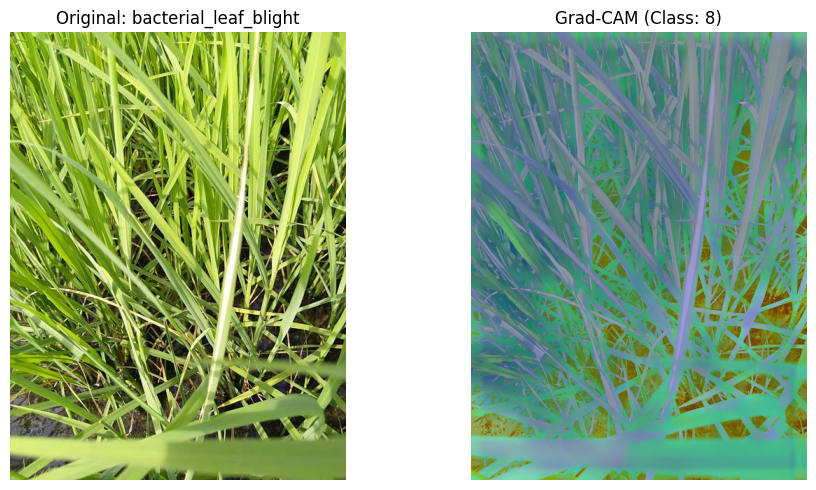

1/1 [==============================] - 0s 19ms/step


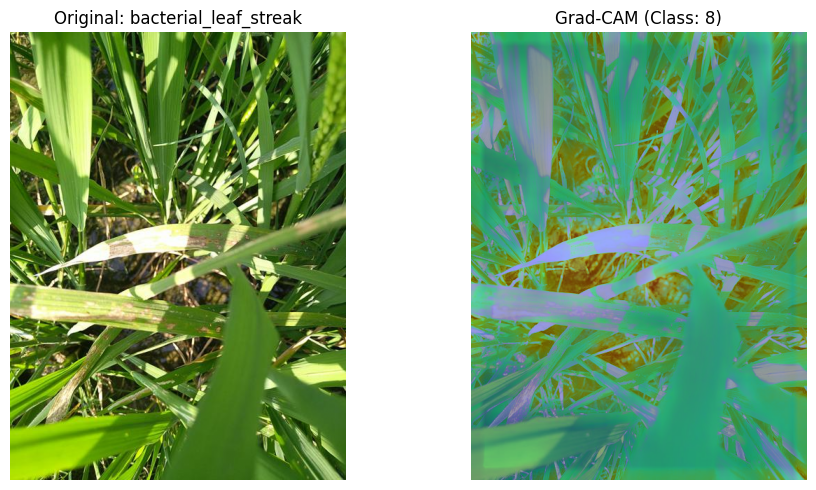

1/1 [==============================] - 0s 20ms/step


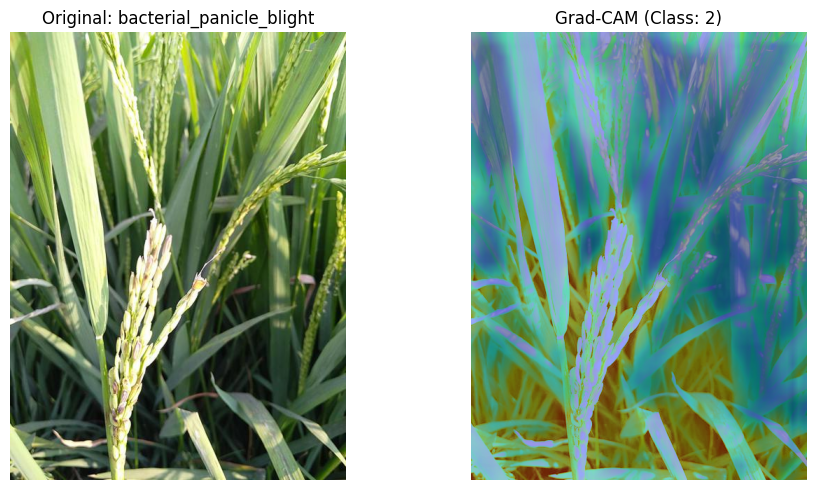

1/1 [==============================] - 0s 23ms/step


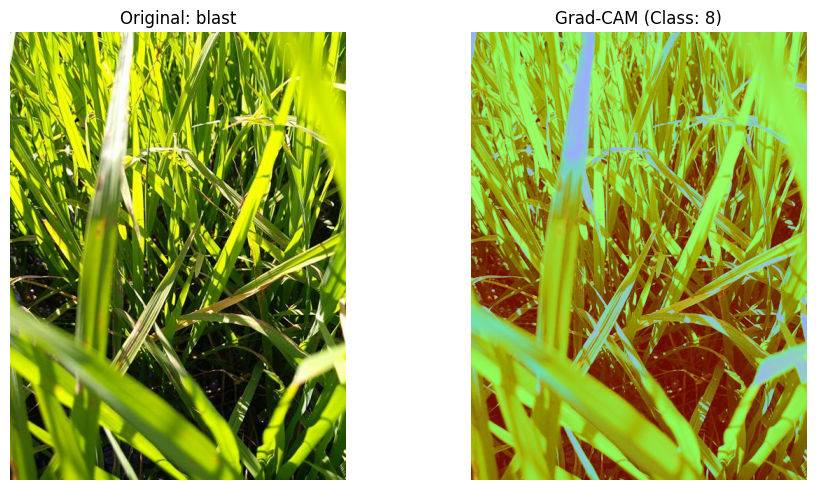

1/1 [==============================] - 0s 19ms/step


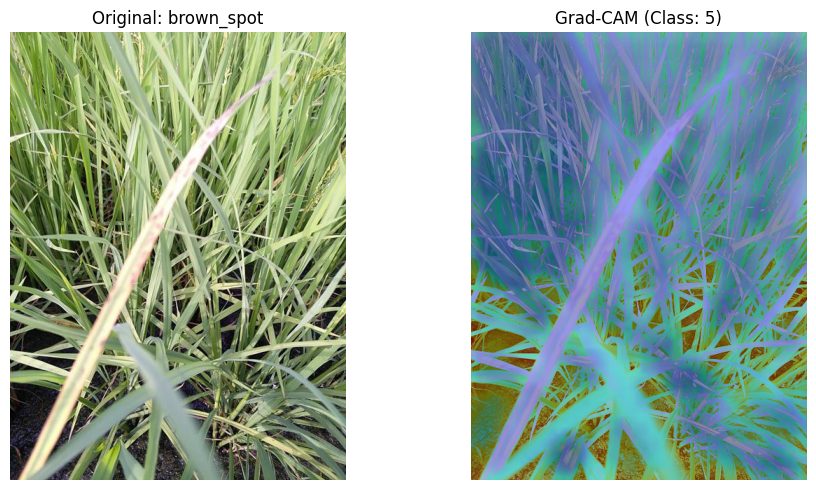

1/1 [==============================] - 0s 20ms/step


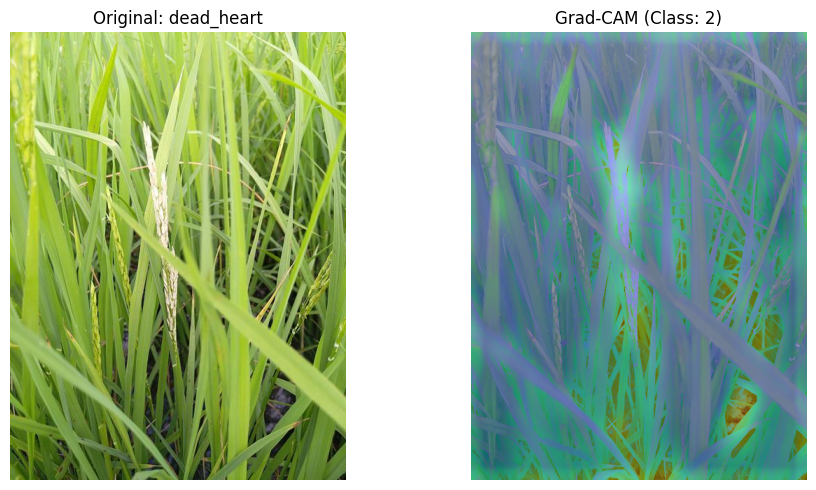

1/1 [==============================] - 0s 19ms/step


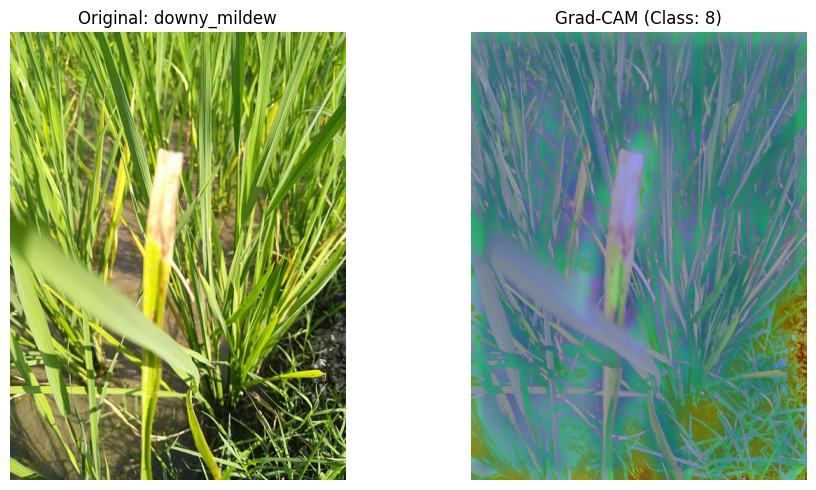

1/1 [==============================] - 0s 19ms/step


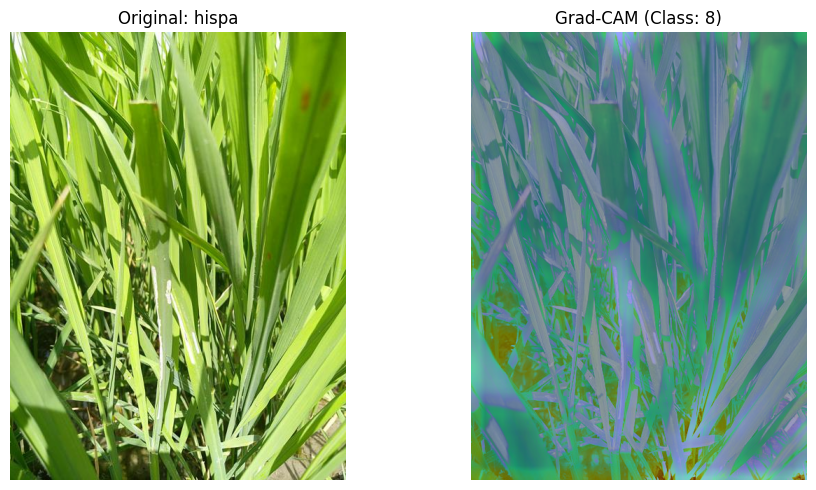

1/1 [==============================] - 0s 20ms/step


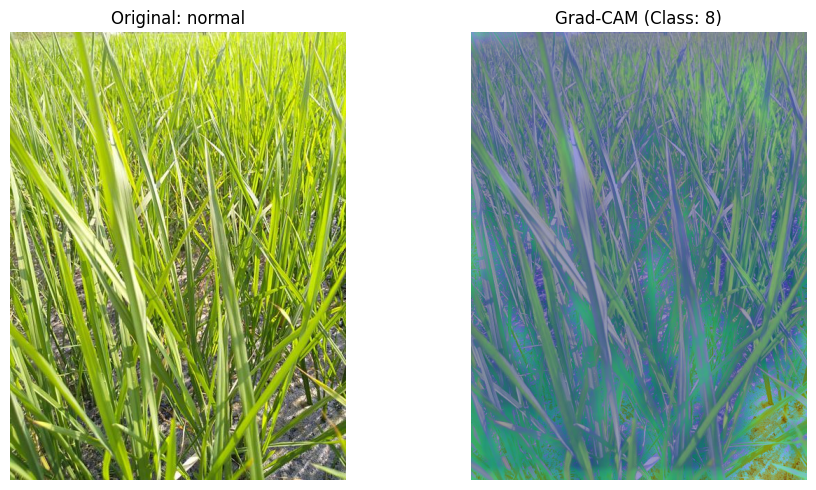

1/1 [==============================] - 0s 19ms/step


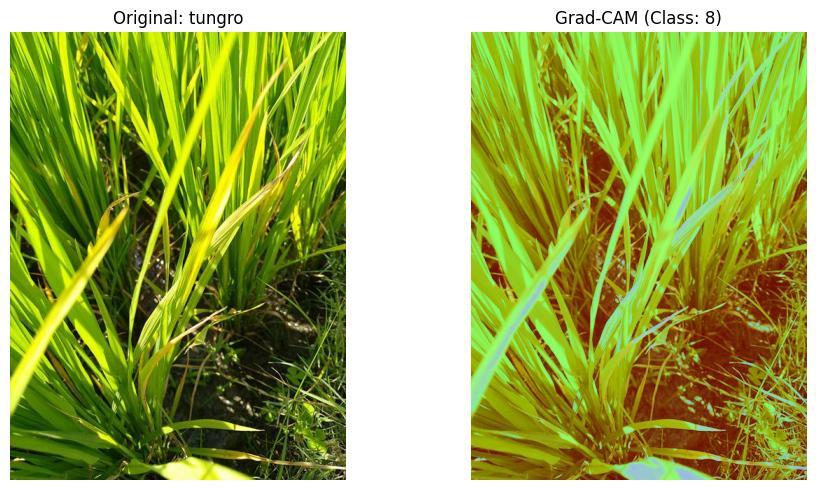

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import iglob
from tf_explain.core.grad_cam import GradCAM

def rescale_image_rectangular(frame, target_width=480, target_height=640, interpolation=cv2.INTER_AREA):
    """Resizes image to specified rectangular dimensions WITHOUT maintaining aspect ratio."""
    return cv2.resize(frame, (target_width, target_height), interpolation)

def get_sample_images_per_class(base_path, target_width=480, target_height=640):
    """Loads one sample image per class and resizes it to specified dimensions."""
    class_images = {}
    for class_name in os.listdir(base_path):
        class_dir = os.path.join(base_path, class_name)
        if os.path.isdir(class_dir):
            for file in iglob(os.path.join(class_dir, "*.jpg")):
                img = cv2.imread(file)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
                if img is not None:
                    img = rescale_image_rectangular(img, target_width, target_height) / 255.0  # Normalize
                    class_images[class_name] = img
                    break
    return class_images

# Usage with width=480, height=640
sample_images = get_sample_images_per_class(config["data_path"], target_width=480, target_height=640)

# Initialize Grad-CAM
explainer = GradCAM()

for class_name, image in sample_images.items():
    pred = model_1.predict(image[np.newaxis, ...])
    predicted_class_index = np.argmax(pred)
    
    # Generate Grad-CAM heatmap
    grid = explainer.explain(
        validation_data=(image[np.newaxis, ...], None), 
        model=model_1,
        layer_name="concatenate",  
        class_index=predicted_class_index,
    )
    
    # Enhanced visualization
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Original: {class_name}")
    plt.axis('off')
    
    # Process heatmap for better visibility
    heatmap = np.uint8(255 * grid)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    # Superimpose with better blending
    superimposed = cv2.addWeighted(np.uint8(255 * image), 0.6, heatmap, 0.4, 0)
    
    # Grad-CAM visualization
    plt.subplot(1, 2, 2)
    plt.imshow(superimposed)
    plt.title(f"Grad-CAM (Class: {predicted_class_index})")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_813/1545481028.py:2: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(num_holes_range=[2, 6], hole_height_range=[0.01, 0.02], hole_width_range=[0.01, 0.02], max_holes=3, max_height=5, max_width=5)]}


Label classes: ['bacterial_leaf_blight' 'bacterial_leaf_streak'
 'bacterial_panicle_blight' 'blast' 'brown_spot' 'dead_heart'
 'downy_mildew' 'hispa' 'normal' 'tungro']
Classes:  10

=== Training Configuration ===
Batch size: 100
Input size: (480, 640)
Classes: 10
GPU Memory: 48GB

Model input shape: (None, 640, 480, 3)


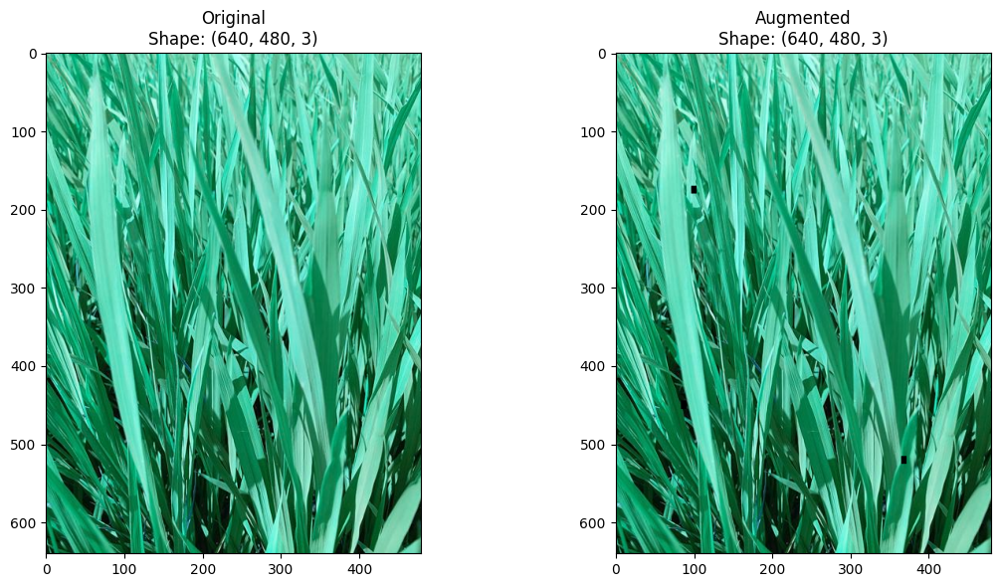

Generator output shape: (100, 640, 480, 3)
Model input shape: (None, 640, 480, 3)
Epoch 1/50
82/82 [==============================] - 95s 1s/step - loss: 2.2155 - accuracy: 0.2335 - val_loss: 2.5762 - val_accuracy: 0.1710 - lr: 0.0010
Epoch 2/50
82/82 [==============================] - 89s 1s/step - loss: 1.9908 - accuracy: 0.2786 - val_loss: 2.4234 - val_accuracy: 0.1921 - lr: 0.0010
Epoch 3/50
82/82 [==============================] - 88s 1s/step - loss: 1.9333 - accuracy: 0.3066 - val_loss: 2.2811 - val_accuracy: 0.1857 - lr: 0.0010
Epoch 4/50
82/82 [==============================] - 89s 1s/step - loss: 1.8775 - accuracy: 0.3330 - val_loss: 2.5093 - val_accuracy: 0.2082 - lr: 0.0010
Epoch 5/50
82/82 [==============================] - 90s 1s/step - loss: 1.7870 - accuracy: 0.3651 - val_loss: 2.9451 - val_accuracy: 0.2220 - lr: 0.0010
Epoch 6/50
82/82 [==============================] - 89s 1s/step - loss: 1.6890 - accuracy: 0.3947 - val_loss: 2.5035 - val_accuracy: 0.2925 - lr: 0.0010


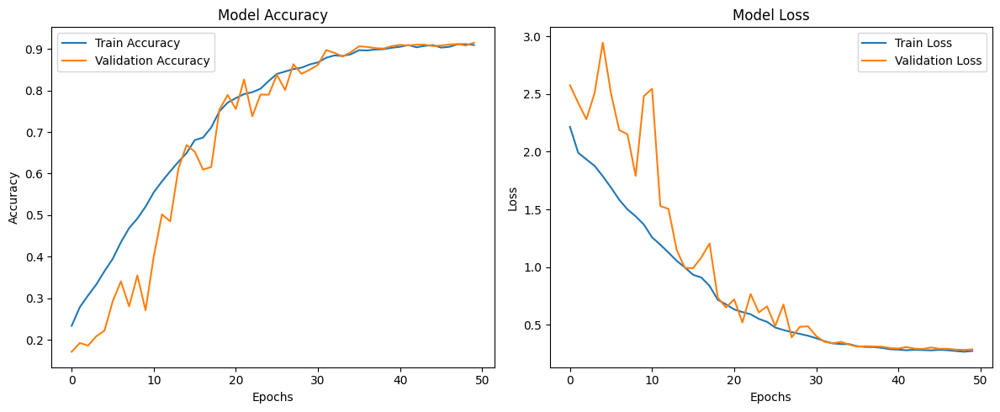

Evaluating on 2041 samples

[DEBUG] First batch - X shape: (100, 640, 480, 3), y shape: (100,)
[DEBUG] Sample label: 5 -> dead_heart
21/21 [==============================] - 18s 833ms/step - loss: 0.2866 - acc: 0.9147 - top3_acc: 0.9799

[METRICS] Evaluation Results: {'loss': 0.2866457402706146, 'acc': 0.9147476553916931, 'top3_acc': 0.9799118041992188}


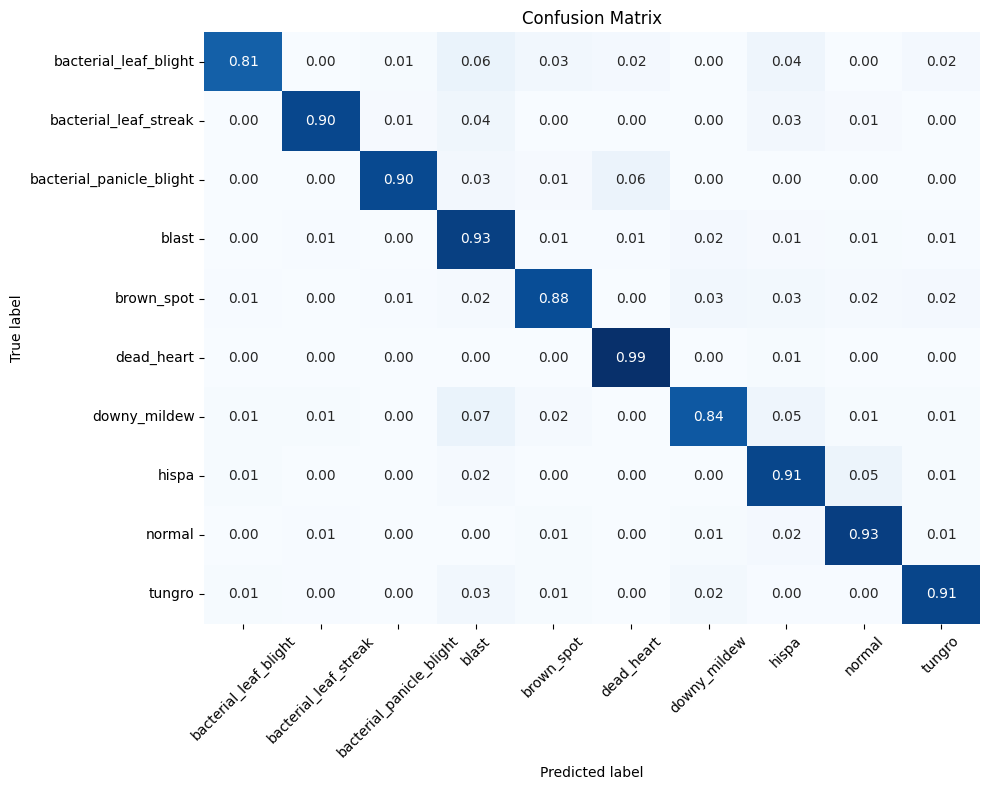


Classification Report:
                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.90      0.81      0.85        93
   bacterial_leaf_streak       0.92      0.90      0.91        73
bacterial_panicle_blight       0.92      0.90      0.91        67
                   blast       0.90      0.93      0.91       341
              brown_spot       0.93      0.88      0.90       188
              dead_heart       0.97      0.99      0.98       283
            downy_mildew       0.82      0.84      0.83       122
                   hispa       0.90      0.91      0.90       311
                  normal       0.93      0.93      0.93       349
                  tungro       0.92      0.91      0.92       214

                accuracy                           0.92      2041
               macro avg       0.91      0.90      0.90      2041
            weighted avg       0.92      0.92      0.92      2041



In [17]:
config_2 = {**config,"augmentation": [A.Resize(width=480, height=640),  
                                      A.CoarseDropout(num_holes_range=[2, 6], hole_height_range=[0.01, 0.02], hole_width_range=[0.01, 0.02], max_holes=3, max_height=5, max_width=5)]}

best_model_dir_2 = os.path.join(config_2["save_dir"], "best_2.keras")
model_2, history_2 = train(config_2, best_model_dir_2)
plot_accuracy_loss(history_2)
evaluate_model(config_2, best_model_dir_2, use_val_set=True)

history_dir_2 = os.path.join(config_2["save_dir"], "history_2.csv")
history_df_2 = pd.DataFrame(history_2.history)
history_df_2.to_csv(history_dir_2, index=False)